## Principal Component Analysis

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from pca_utils import plot_widget
from bokeh.io import show, output_notebook
from bokeh.plotting import figure
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.express as px

In [2]:
output_notebook()

Loading BokehJS ...

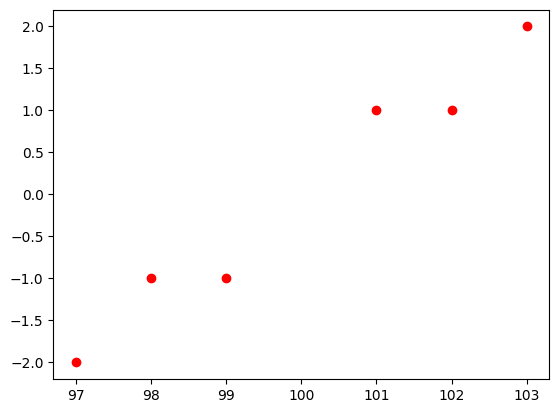

In [3]:
X = np.array([[ 99,  -1],
       [ 98,  -1],
       [ 97,  -2],
       [101,   1],
       [102,   1],
       [103,   2]])
plt.plot(X[:,0], X[:,1], 'ro')

In [4]:
pca_2 = PCA(n_components=2)
pca_2

PCA(n_components=2)

In [5]:
pca_2.fit(X)

PCA(n_components=2)

In [6]:
pca_2.explained_variance_ratio_

array([0.99244289, 0.00755711])

In [7]:
X_trans_2 = pca_2.transform(X)
X_trans_2

array([[-1.38340578, -0.2935787 ],
       [-2.22189802,  0.25133484],
       [-3.6053038 , -0.04224385],
       [ 1.38340578,  0.2935787 ],
       [ 2.22189802, -0.25133484],
       [ 3.6053038 ,  0.04224385]])

In [8]:
pca_1 = PCA(n_components=1)
pca_1.fit(X)
pca_1.explained_variance_ratio_

array([0.99244289])

In [9]:
X_trans_1 = pca_1.transform(X)
X_trans_1

array([[-1.38340578],
       [-2.22189802],
       [-3.6053038 ],
       [ 1.38340578],
       [ 2.22189802],
       [ 3.6053038 ]])

In [10]:
X_reduced_2 = pca_2.inverse_transform(X_trans_2)
X_reduced_2

array([[ 99.,  -1.],
       [ 98.,  -1.],
       [ 97.,  -2.],
       [101.,   1.],
       [102.,   1.],
       [103.,   2.]])

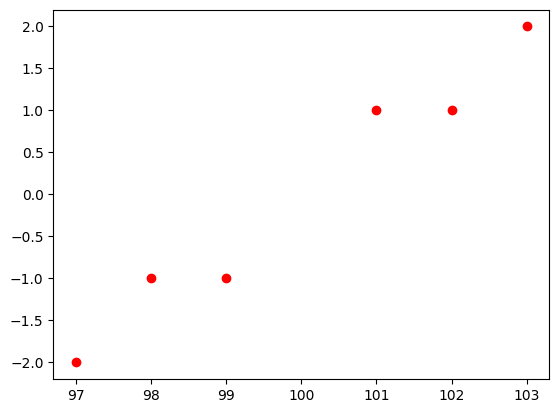

In [11]:
plt.plot(X_reduced_2[:,0], X_reduced_2[:,1], 'ro')

In [12]:
X_reduced_1 = pca_1.inverse_transform(X_trans_1)
X_reduced_1

array([[ 98.84002499,  -0.75383654],
       [ 98.13695576,  -1.21074232],
       [ 96.97698075,  -1.96457886],
       [101.15997501,   0.75383654],
       [101.86304424,   1.21074232],
       [103.02301925,   1.96457886]])

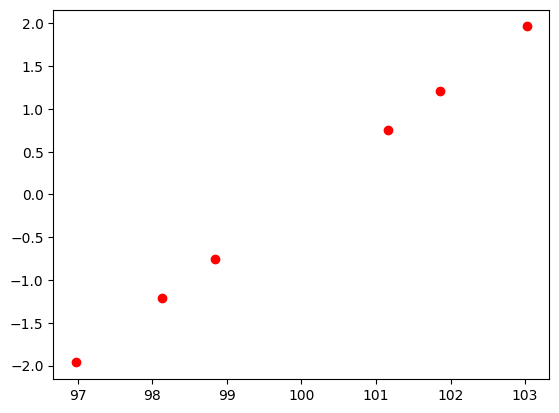

In [13]:
plt.plot(X_reduced_1[:, 0], X_reduced_1[:, 1], 'ro')

### Visualizing the PCA Algorithm

In [14]:
def random_point_circle(center=(0,0),radius=1,n=1):
    r = radius * np.sqrt(np.random.rand(n))
    theta = np.random.rand(n) * 2 * np.pi
    x = center[0] + r * np.cos(theta)
    y = center[1] + r * np.sin(theta)
    return np.array([x,y]).T

def plot_3d_2d_graphs(X):
    df = pd.DataFrame(X, columns = ['x1','x2'])
    df['x3'] = df['x1'] + df['x2']
    fig = make_subplots(rows=1, cols=2, specs = [[{"type":"scatter3d"}, {"type":"scatter"}]])


    fig.add_trace(go.Scatter3d(x= df['x1'], 
                      y = df['x2'], 
                      z = df['x3'], 
                      mode = 'markers'),
                      row = 1,
                      col = 1
                        ).update_traces(marker = dict(color = "#C00000", symbol = "x", size = 2),
                                        ).update_layout(scene = dict(xaxis = dict(range = [-1.5,1.5], showgrid=False),
                                                                     xaxis_title = 'x1',
                                                                     yaxis = dict(range = [-1.5,1.5], showgrid = False),
                                                                     yaxis_title = 'x2',
                                                                     zaxis = dict(range = [-1.5,1.5], showgrid = False),
                                                                     zaxis_title = 'x3'))

    fig.add_trace(go.Scatter(x = df.rename(columns = {'x1':'z1'})['z1'],
                             y = df.rename(columns = {'x2':'z2'})['z2'],
                             mode = "markers",
                             showlegend=False
                            ),
                    row = 1,
                    col = 2)
    return fig
    fig.show()

In [15]:
X = random_point_circle(n = 150)
deb = plot_3d_2d_graphs(X)
deb.update_layout(yaxis2 = dict(title_text = 'test', visible=True))

### Using PCA in Exploratory Data Analysis

In [16]:
df = pd.read_csv('toy_dataset.csv')
df.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_990,feature_991,feature_992,feature_993,feature_994,feature_995,feature_996,feature_997,feature_998,feature_999
0,27.422157,-29.662712,-23.297163,-15.161935,0.345581,3.706750,-5.507209,-46.992476,5.175469,-47.768145,...,7.815960,24.320965,-33.987522,22.306088,31.173511,31.264830,8.380699,-25.843189,36.706408,-43.480792
1,3.489482,-19.153551,-14.636424,14.688258,20.114204,13.532852,34.298084,22.982509,37.938670,-35.648144,...,11.145527,-38.886603,44.579337,37.308519,29.560535,-10.643331,-6.499263,19.921666,-3.528982,31.068739
2,4.293509,22.691579,-1.045155,-8.740350,12.401082,31.362987,-18.831206,-35.384557,8.161430,-16.421762,...,48.190331,-0.503157,-21.740678,15.972237,1.122335,-45.473538,10.518065,-5.818320,-29.466301,-13.676685
3,-2.139348,23.158754,-26.241206,19.426465,9.472049,8.453948,0.637211,-26.675984,-43.823329,11.840874,...,-51.613076,13.278858,-44.179281,32.912282,4.805774,3.960836,-15.888356,61.384773,33.112334,5.088320
4,-35.251034,27.281816,-29.470282,-21.786865,11.806822,58.655133,5.375230,59.740676,-49.007717,-21.801155,...,0.010857,20.975655,-21.358371,18.709369,22.362477,41.214565,-7.217724,31.173870,37.097532,-27.509420


In [17]:
def get_pairs(n = 100):
    from random import randint
    i = 0
    tuples = []
    while i < 100:
        x = df.columns[randint(0,999)]
        y = df.columns[randint(0,999)]
        while x == y or (x,y) in tuples or (y,x) in tuples:
            y = df.columns[randint(0,999)]
        tuples.append((x,y))
        i+=1
    return tuples

pairs = get_pairs()

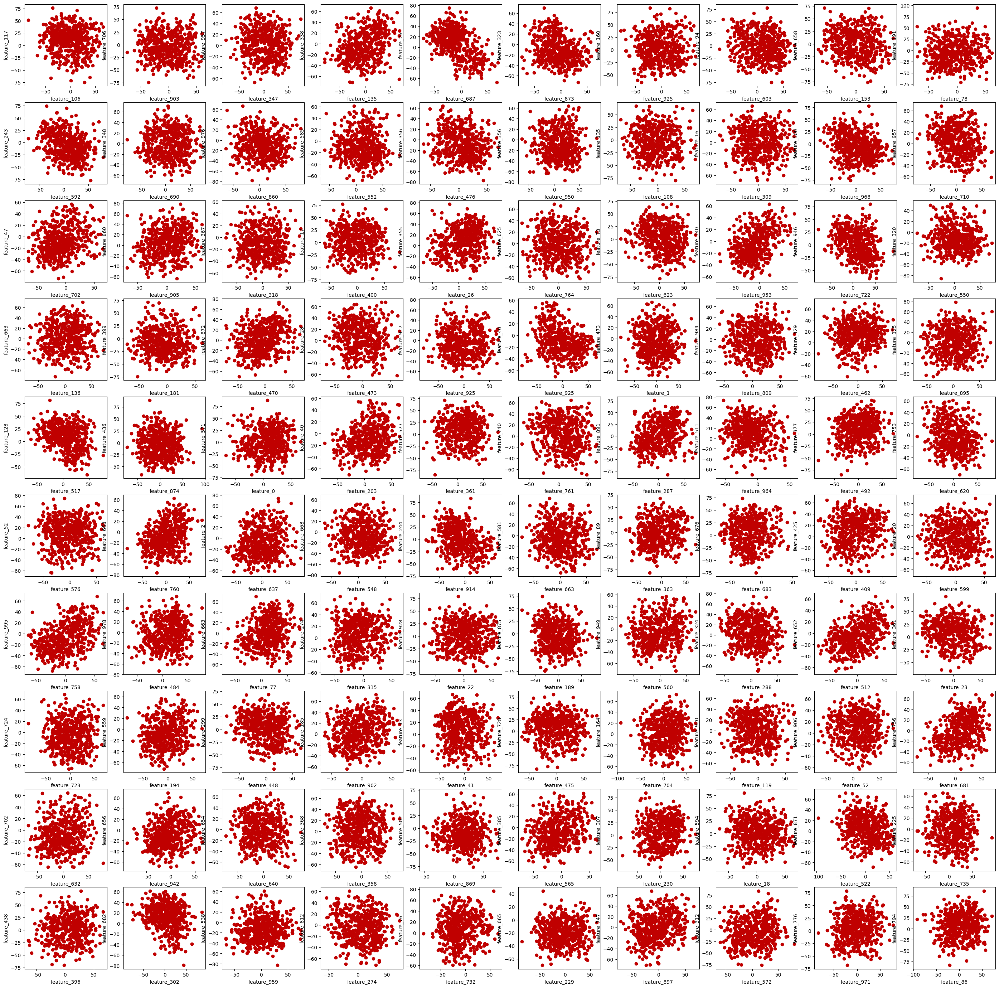

In [18]:
fig, axs = plt.subplots(10,10, figsize = (35,35))
i = 0
for rows in axs:
    for ax in rows:
        ax.scatter(df[pairs[i][0]],df[pairs[i][1]], color = "#C00000")
        ax.set_xlabel(pairs[i][0])
        ax.set_ylabel(pairs[i][1])
        i+=1

In [19]:
corr = df.corr()
mask = (abs(corr) > 0.5) & (abs(corr) != 1)
corr.where(mask).stack().sort_values()

feature_81   feature_657   -0.631294
feature_657  feature_81    -0.631294
feature_313  feature_4     -0.615317
feature_4    feature_313   -0.615317
feature_716  feature_1     -0.609056
                              ...   
feature_792  feature_547    0.620864
feature_35   feature_965    0.631424
feature_965  feature_35     0.631424
feature_395  feature_985    0.632593
feature_985  feature_395    0.632593
Length: 1870, dtype: float64

In [20]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df)
df_pca = pd.DataFrame(X_pca, columns = ['principal_component_1','principal_component_2'])
df_pca.head()

,principal_component_1,principal_component_2
0,46.235641,-1.672797
1,210.208758,-84.068249
2,26.352795,-127.895751
3,116.106804,-269.368256
4,110.183605,-279.657306


Text(0.5, 1.0, 'PCA decomposition')

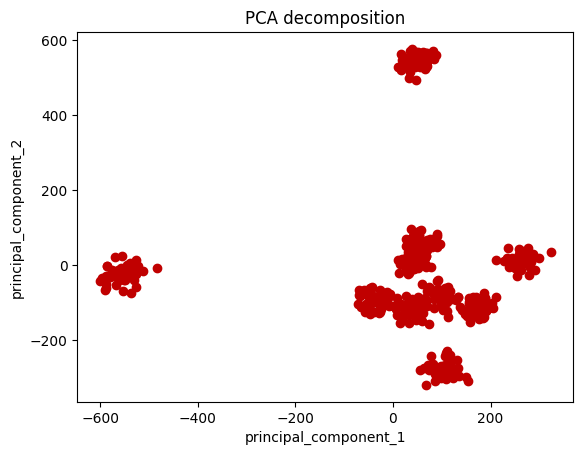

In [21]:
plt.scatter(df_pca['principal_component_1'], df_pca['principal_component_2'], color='#C00000')
plt.xlabel('principal_component_1')
plt.ylabel('principal_component_2')
plt.title('PCA decomposition')

In [22]:
sum(pca.explained_variance_ratio_)

0.14572843555106288

In [23]:
pca_3 = PCA(n_components=3)
X_t = pca_3.fit_transform(df)
df_pca_3 = pd.DataFrame(X_t, columns=['principal_component_1','principal_component_2','principal_component_3'])

In [24]:
fig = px.scatter_3d(df_pca_3, x = 'principal_component_1', y = 'principal_component_2', z = 'principal_component_3').update_traces(marker = dict(color='#C00000'))
fig.show()